# SWOP script 2
## Visualize ERPs using classical baseline procedure

Analysis script associated with the manuscript: ***Native word order processing is not uniform: An ERP-study of verb-second word order***, by Susan Sayehli, Marianne Gullberg, Aaron Newman, and Annika Andersson. Currently under review with *Frontiers in Psychology - Language Sciences*, manuscript 668276.

This notebook reads in the *-epo.fif evoked files from individual subjects that were produced by the script *SWOP 1 - Preprocessing*

This script visualizes ERPs using the classical 100 ms baseline subtraction procedure, as well as showing the data epoched over long windows (-1 s pre-stimulus to 1 s post-stimulus) with *no* baselie correction. The results shown here are *not* what is presented in the manuscript or used in statistical analyses. Rather, these are meant as a reference to demonstrate how the data would look if not subjected to baseline regression. The results demonstrate significant variation in the waveforms, betwen different conditions, prior to the onset of the critical words of interest. These differences motivate the use of baseline regression.

---
Copyright 2016-21  [Aaron J Newman](https://github.com/aaronjnewman), [NeuroCognitive Imaging Lab](http://ncil.science), [Dalhousie University](https://dal.ca)

Released under the [The 3-Clause BSD License](https://opensource.org/licenses/BSD-3-Clause)

---

# Initialization

## Load in the necessary libraries/packages we'll need

In [1]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import mne

mne.set_log_level(verbose='error')

# For big arrays of waveplots
waveplot_figsize = (18, 4)

# Change this to 300 for generating hi rez (poster/paper) images. Use 72 for on-screen viewing. Number affects size of image on screen
matplotlib.rcParams['figure.dpi'] = 72  

## List of subjects

In [2]:
subjects = ['s_04nm',  's_07ba',  's_09lo',  's_12wg',  's_13ff',  's_14mc',
            's_15rj',  's_17oh',  's_18ak',  's_19am',  's_21ma',  's_23nj',
            's_24zk',  's_25ks',  's_26nm',  's_27lm',  's_28js',  's_29ld',
            's_30la',  's_31bf']

## Time windows of interest

In [3]:
# Define the traditional baseline window
baseline = (-.100, 0.)
tmin, tmax = -.100, 1.
# Define start & end of time window to compute mean amplitude over
time_wins = [(.100, .300), (.300, .500), (.500, .700), (.700, .900), (.900, 1.000)]

## Conditions and Contrasts of Interest

In [4]:
target_words = ['kanske', 'hemma', 'idag']

conditions = ['V2/kanske', 'V3/kanske', 
              'V2/hemma',  'V3/hemma',
              'V2/idag',   'V3/idag'
             ]

contrasts = {'kanske':['V3/kanske', 'V2/kanske'],
             'hemma':['V3/hemma',   'V2/hemma'],
             'idag':['V3/idag',     'V2/idag'],             
             }

---
# Read in the data

In [5]:
data_path = '../data/'

epochs = {}
epochs_bs100 = {}
for subject in subjects:
    epochs[subject] = mne.read_epochs(str(data_path + subject + '-epo.fif'),
                                         proj=False, 
                                         verbose=None, 
                                         preload=True).set_eeg_reference(ref_channels=['M1', 'M2'])
    
    epochs_bs100[subject] = mne.read_epochs(str(data_path + subject + '-epo.fif'),
                                            proj=False, 
                                            verbose=None, 
                                            preload=True).crop(tmin, tmax).set_eeg_reference(ref_channels=['M1', 'M2']).apply_baseline(baseline)

## Create Evokeds

In [6]:
evoked = {}
evoked_bs100 = {}
for cond in conditions:   
    evoked[cond] = [epochs[subject][cond].average() for subject in subjects]
    evoked_bs100[cond] = [epochs_bs100[subject][cond].average() for subject in subjects]

## Grand Averages

In [7]:
gavg = {}
gavg_bs100 = {}
for cond in conditions:
    gavg[cond] = mne.grand_average(evoked[cond])
    gavg_bs100[cond] = mne.grand_average(evoked_bs100[cond])

## Compute Contrasts
Differences between pairs of conditions

In [8]:
evoked_diff = {}
evoked_diff_bs100 = {}

for contr, conds in contrasts.items():
    evoked_diff[contr] = [mne.combine_evoked([ c1, c2],
                                             weights=[1, -1])
                          for (c1, c2) in zip(evoked[conds[0]], evoked[conds[1]])
                         ]
    
    evoked_diff_bs100[contr] = [mne.combine_evoked([ c1, c2],
                                             weights=[1, -1])
                          for (c1, c2) in zip(evoked_bs100[conds[0]], evoked_bs100[conds[1]])
                         ]

## Define ROIs
clusters of electrodes to average over for waveform plots

In [9]:
ch_names = epochs[subjects[0]].ch_names

roi_mapping = {'Left Ant':['F7', 'FT7', 'F3', 'FC3'],
               'Mid Ant':['Fz'],
               'Right Ant':['F8', 'FT8', 'F4', 'FC4'],
               'Left Cent':['T7', 'TP7', 'C3', 'CP3'], 
               'Mid Cent':['Cz'], 
               'Right Cent':['T8', 'TP8', 'C4', 'CP4'],
               'Left Post':['P7', 'P3', 'PO7', 'O1'],
               'Mid Post':['Pz'],
               'Right Post':['P8', 'P4', 'PO8', 'O2']
              }

# roi_mapping = {'Left':['F7', 'FT7', 'F3', 'FC3', 'T7', 'TP7', 'C3', 'CP3', 'P7', 'P3', 'PO7', 'O1'],
#                'Midline':['Fz', 'Cz', 'Pz'],
#                'Right':['F8', 'FT8', 'F4', 'FC4', 'T8', 'TP8', 'C4', 'CP4', 'P8', 'P4', 'PO8', 'O2']
#               }

rois = {}
for region in roi_mapping.keys():
    rois[region] = [ch_names.index(chan) for chan in roi_mapping[region]]

---
# Visualization

Below we plot the data three ways: 
- with no baseline (but mean-centered over the whole epoch)
- with a conventional 100 ms prestimulus baseline
- with the baseline regressed out on an individual-trial basis

## No Baseline

## Butterfly plots with peak finding

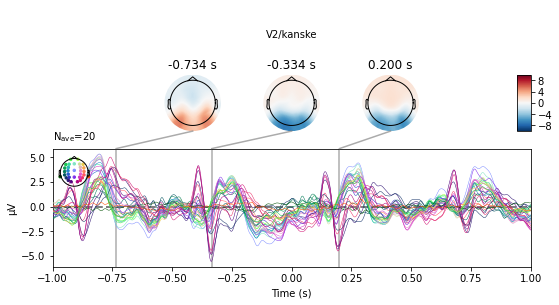

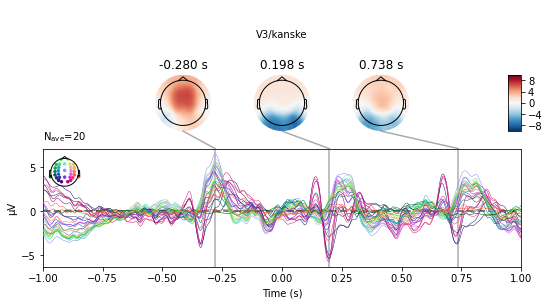

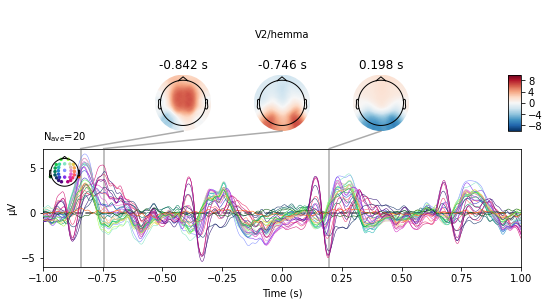

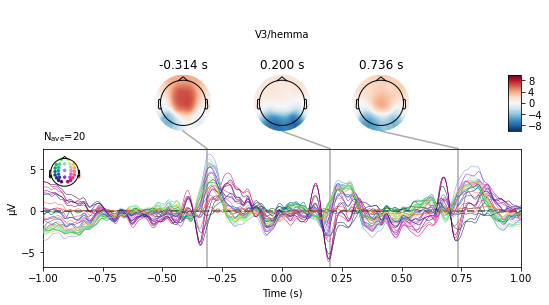

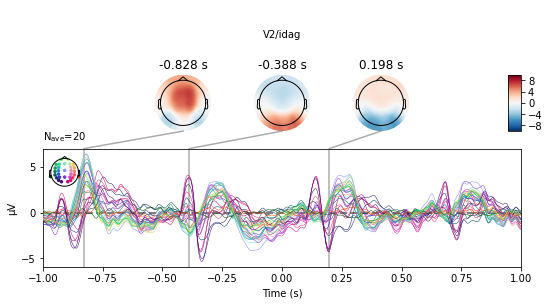

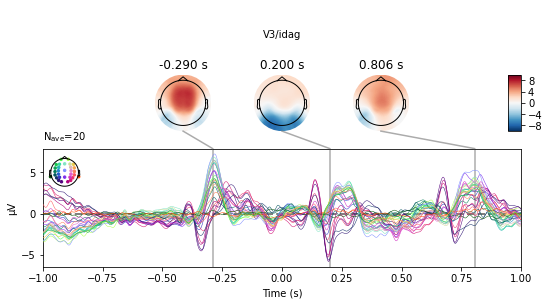

In [10]:
# Peaks based on visual inspection, running this w/o peak times specified.
# However, auto peak-finding will only find at most 3 peaks
peak_times = [.146, .240, .350, .470]
uv_range = 10

for cond in conditions:
    gavg[cond].plot_joint(title=(cond), 
                          ts_args={'hline':[0]},
                          topomap_args={'sensors':False, 'contours':False, 
                                       'vmin':-uv_range, 'vmax':uv_range})

## Topo map time series for each condition

These are not terribly informative, except to veryfiy that in general terms, the averages for all conditions look broadly similar and non-problematic.

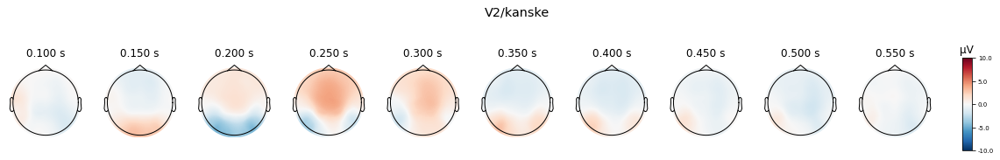

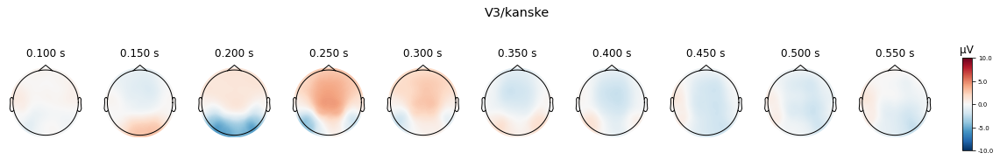

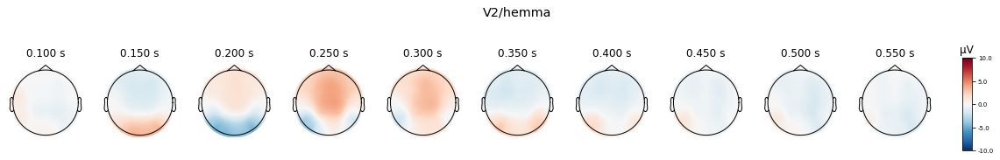

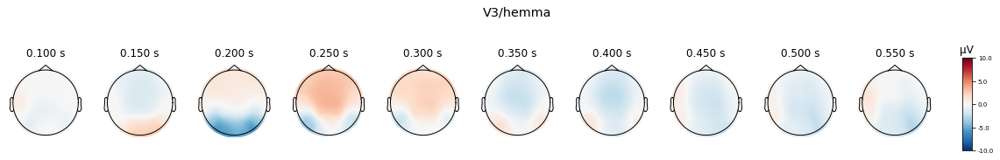

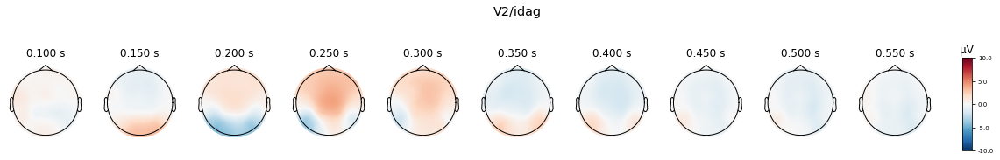

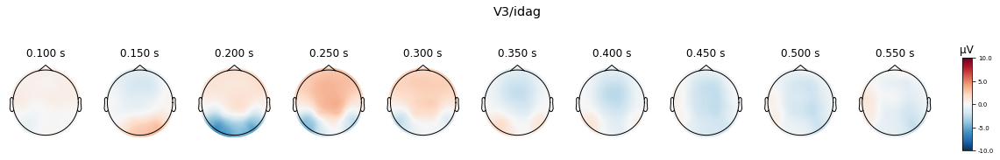

In [11]:
times = np.arange(.100, .600, .050)

uv_range = 10

for cond in conditions:
    gavg[cond].plot_topomap(times, average=0.050,
                           ch_type='eeg', 
                           show_names=False, sensors=False, contours=False, 
                           colorbar=True, 
                           vmin=-uv_range, vmax=uv_range,
                           title=(cond)
                          )


## Waveforms

In [12]:
colors = {'V2/kanske':'darkviolet', 
          'V3/kanske':'dodgerblue', 
          'V2/hemma':'green', 
          'V3/hemma':'green', 
          'V2/idag':'crimson',
          'V3/idag':'crimson'
         }

linestyles = {'V2/kanske':'-', 
              'V3/kanske': '--', 
              'V2/hemma':'-', 
              'V3/hemma':'--', 
              'V2/idag':'-',
              'V3/idag':'--'
             }

### All conditions overlaid

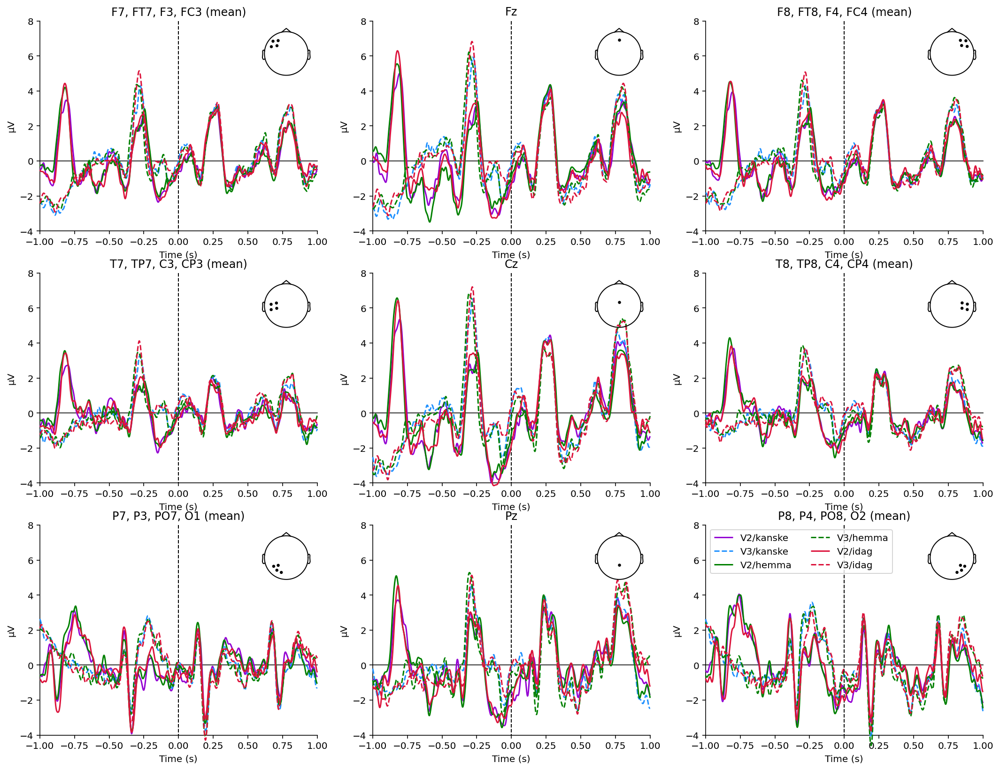

In [13]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({c:evoked[c] for c in conditions},
                                 picks=chans, combine='mean',
#                                  title=roi,
                                 colors=colors, linestyles=linestyles,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=False,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  

### By condition

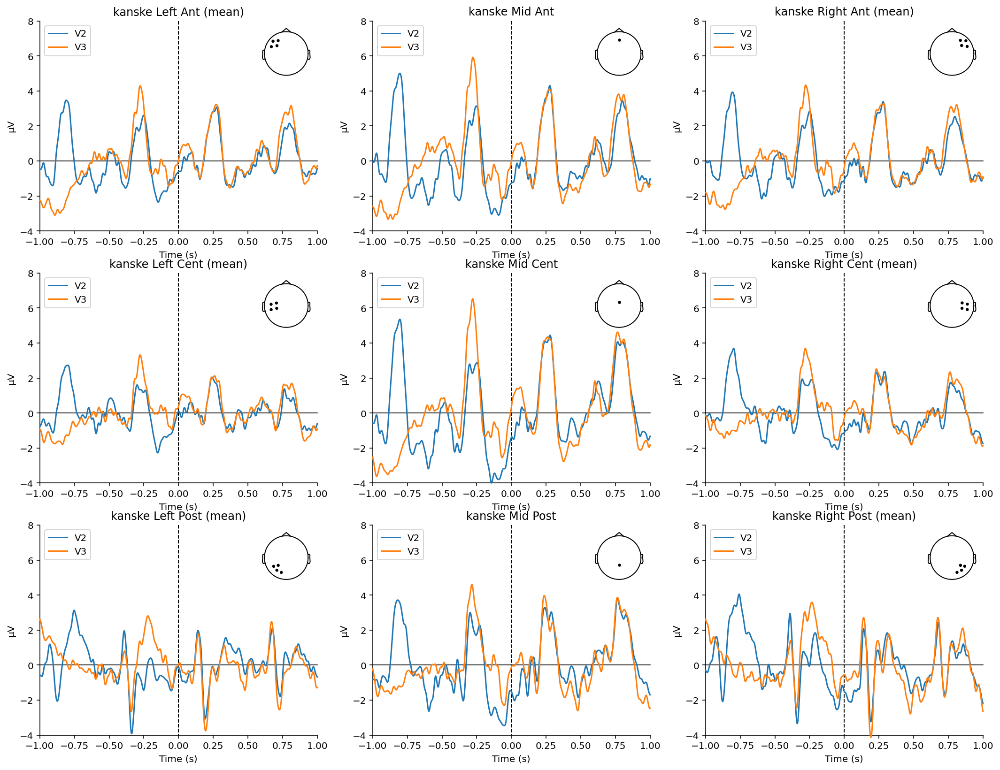

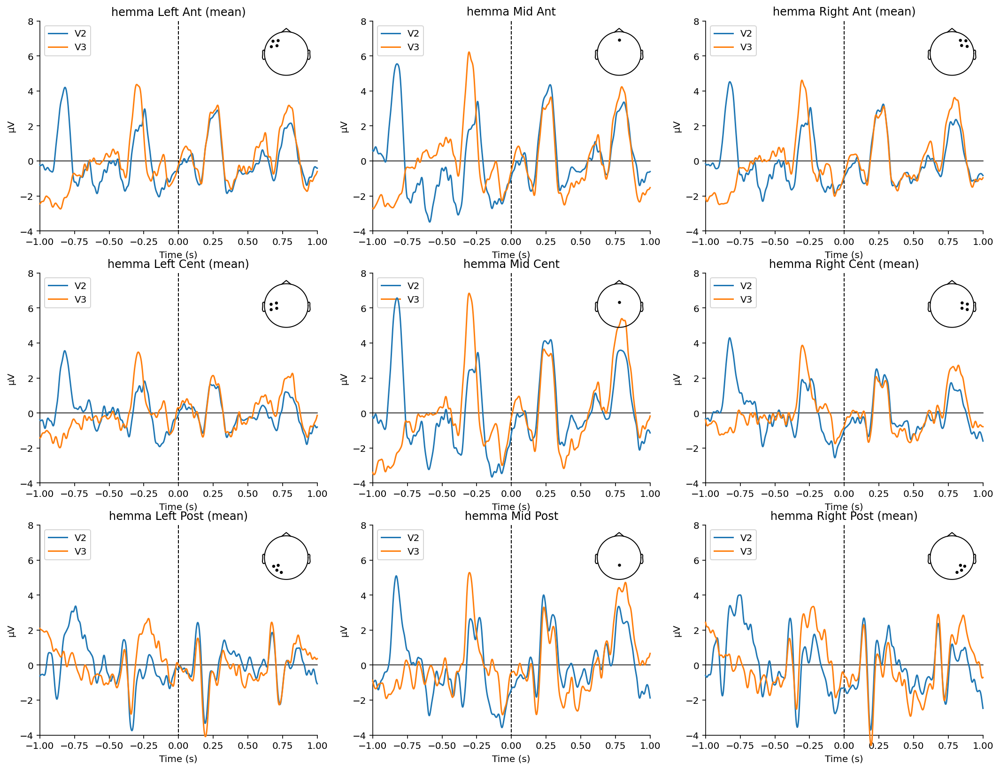

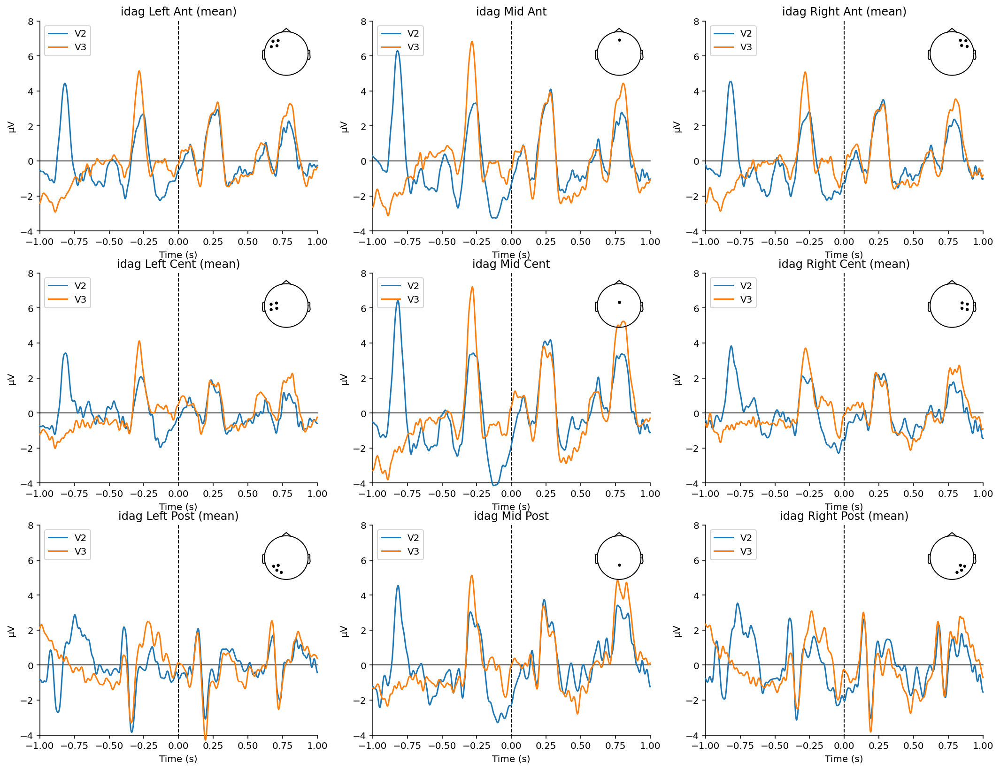

In [14]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

for word in target_words:
    fig, axs = plt.subplots(3, 3, figsize=(18, 14))    

    ax = 0
    for roi, chans in roi_mapping.items():
        if ax == (len(rois.items())-1):
            legend='upper left'
            show=True
        else:
            legend=False
            show=False

        mne.viz.plot_compare_evokeds({c:evoked[c + '/' + word] for c in ['V2', 'V3']},
                                         picks=chans, combine='mean',
                                         title=(word + ' ' + roi),
    #                                      colors=colors, linestyles=linestyles,
                                         ylim=ylim,
                                         show_sensors='upper right', legend='upper left', 
                                         ci=False,
                                         axes=axs.reshape(-1)[ax], show=show
                                        );
        ax += 1
    plt.show()
    
matplotlib.rcParams['figure.dpi'] = 72  

### With CIs

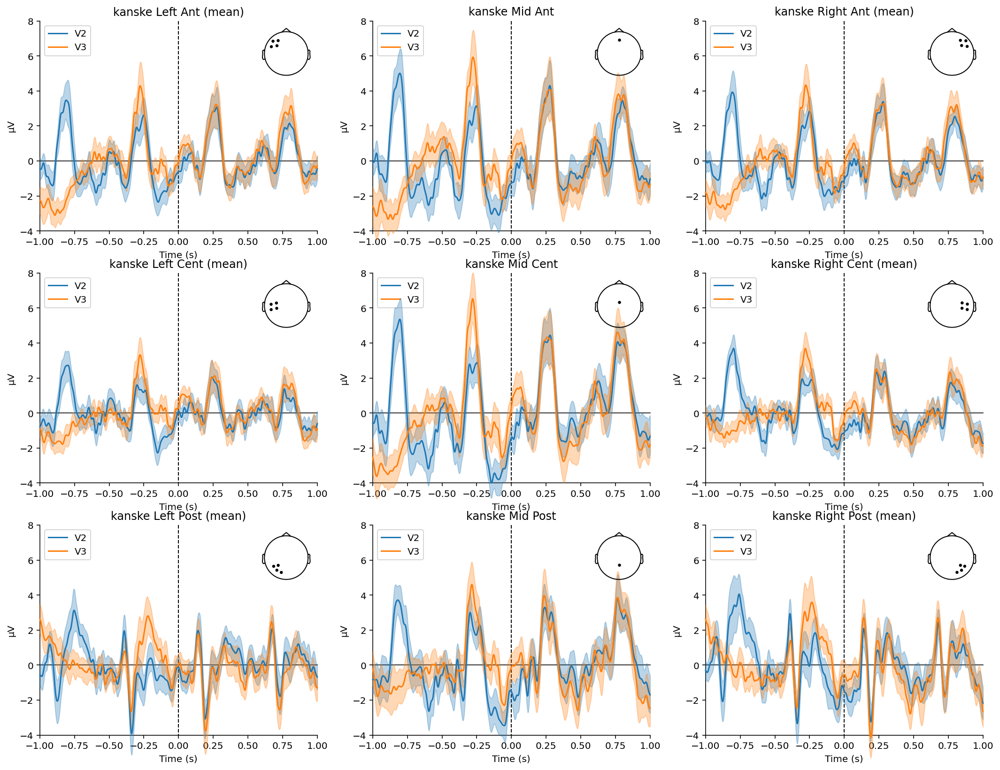

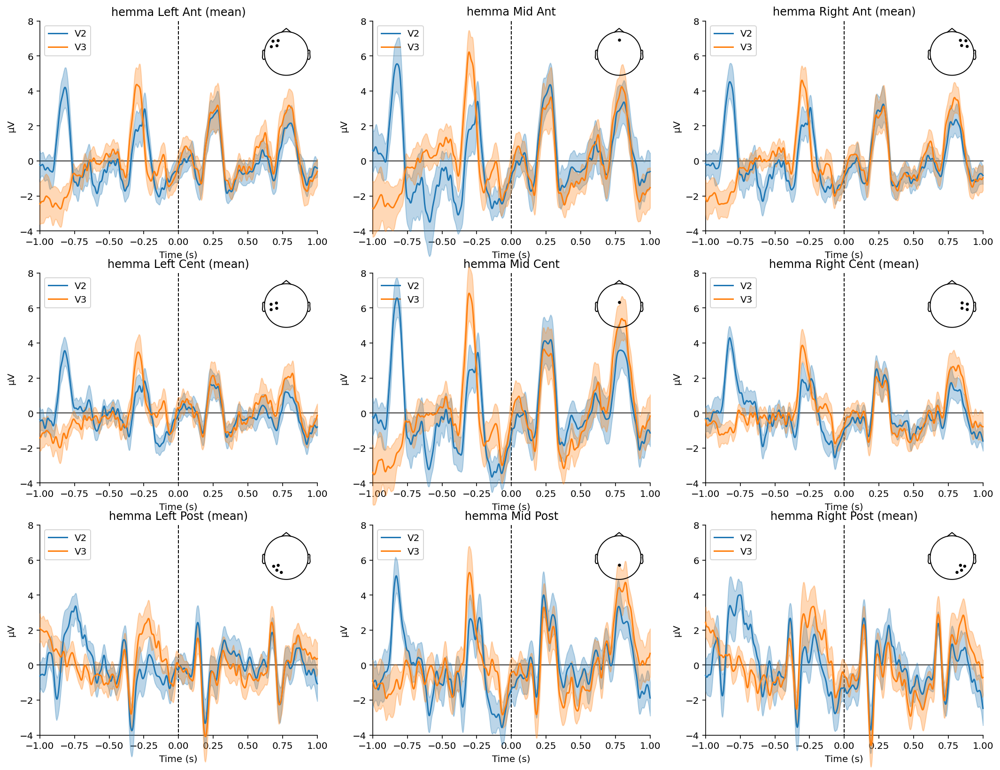

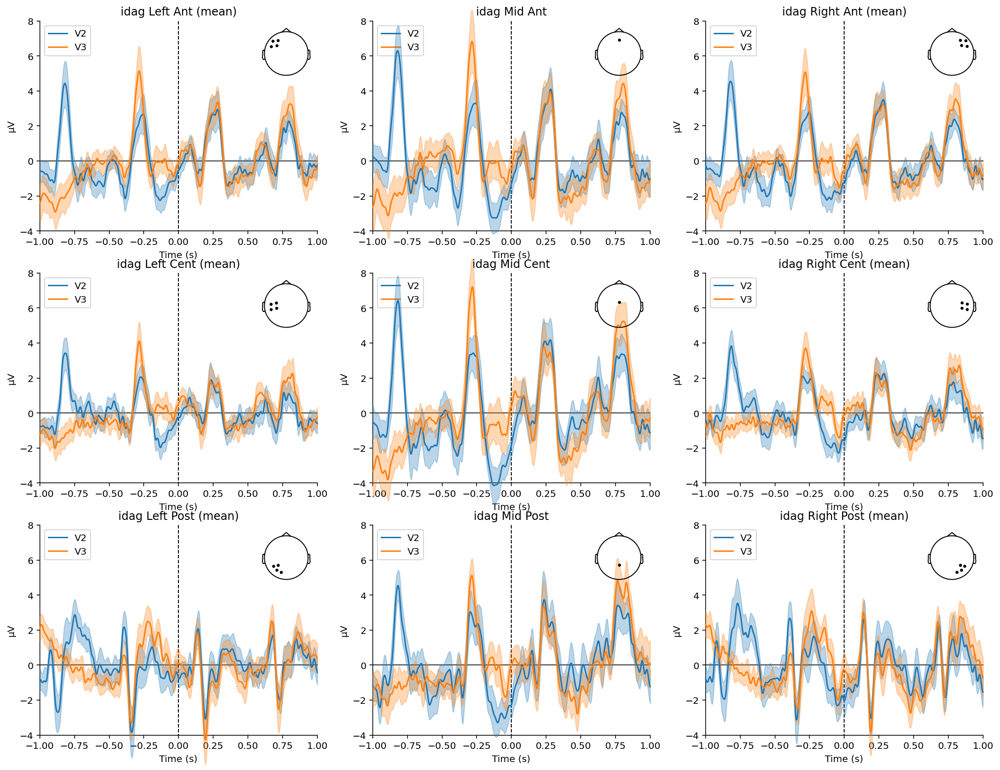

In [15]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

for word in target_words:
    fig, axs = plt.subplots(3, 3, figsize=(18, 14))    

    ax = 0
    for roi, chans in roi_mapping.items():
        if ax == (len(rois.items())-1):
            legend='upper left'
            show=True
        else:
            legend=False
            show=False

        mne.viz.plot_compare_evokeds({c:evoked[c + '/' + word] for c in ['V2', 'V3']},
                                         picks=chans, combine='mean',
                                         title=(word + ' ' + roi),
    #                                      colors=colors, linestyles=linestyles,
                                         ylim=ylim,
                                         show_sensors='upper right', legend='upper left', 
                                         ci=True,
                                         axes=axs.reshape(-1)[ax], show=show
                                        );
        ax += 1
    plt.show()
    
matplotlib.rcParams['figure.dpi'] = 72  

---
# Contrasts 

### Topo Plots

#### 100 ms time windows

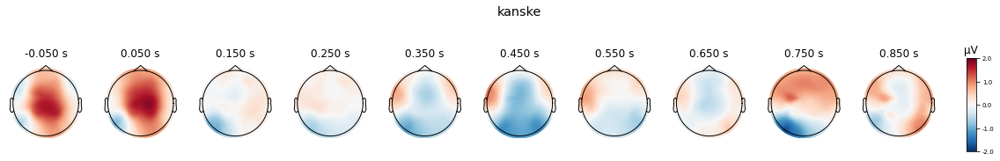

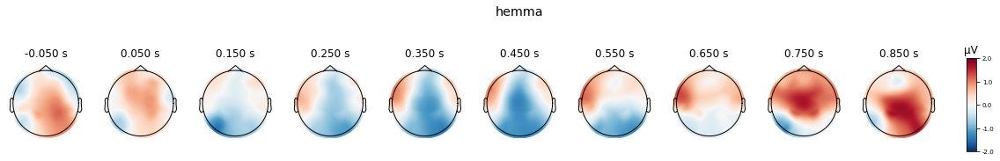

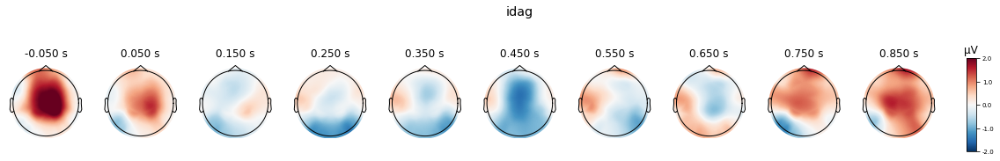

In [16]:
times = np.arange(-.050, .950, .100)

uv_range = 2

for contr in contrasts:
     mne.grand_average(evoked_diff[contr]).plot_topomap(times, average=0.100,
                                                       ch_type='eeg', 
                                                       show_names=False, sensors=False, contours=False, 
                                                       colorbar=True, 
                                                       vmin=-uv_range, vmax=uv_range,
                                                       title=(contr)
                                                      )

#### A priori time windows

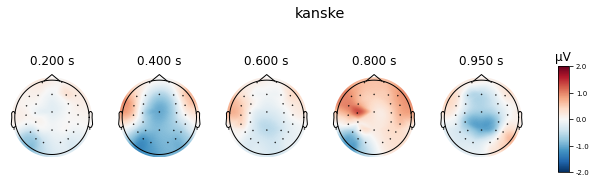

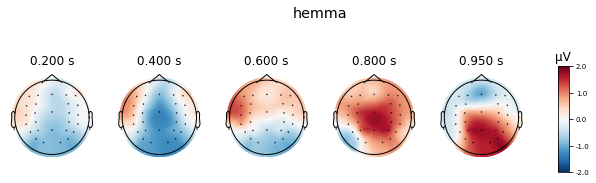

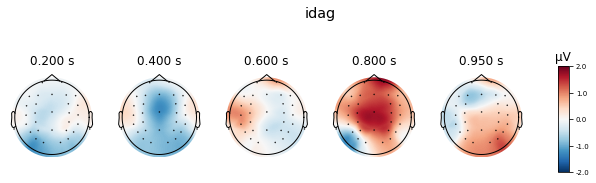

In [17]:
uv_range = 2

for contr in contrasts:
     mne.grand_average(evoked_diff[contr]).plot_topomap([np.median(t) for t in time_wins], average=0.120,
                                                       ch_type='eeg', 
                                                       show_names=False, sensors=True, contours=False, 
                                                       colorbar=True, 
                                                       vmin=-uv_range, vmax=uv_range,
                                                       title=(contr)
                                                      )

### Contrast waveforms

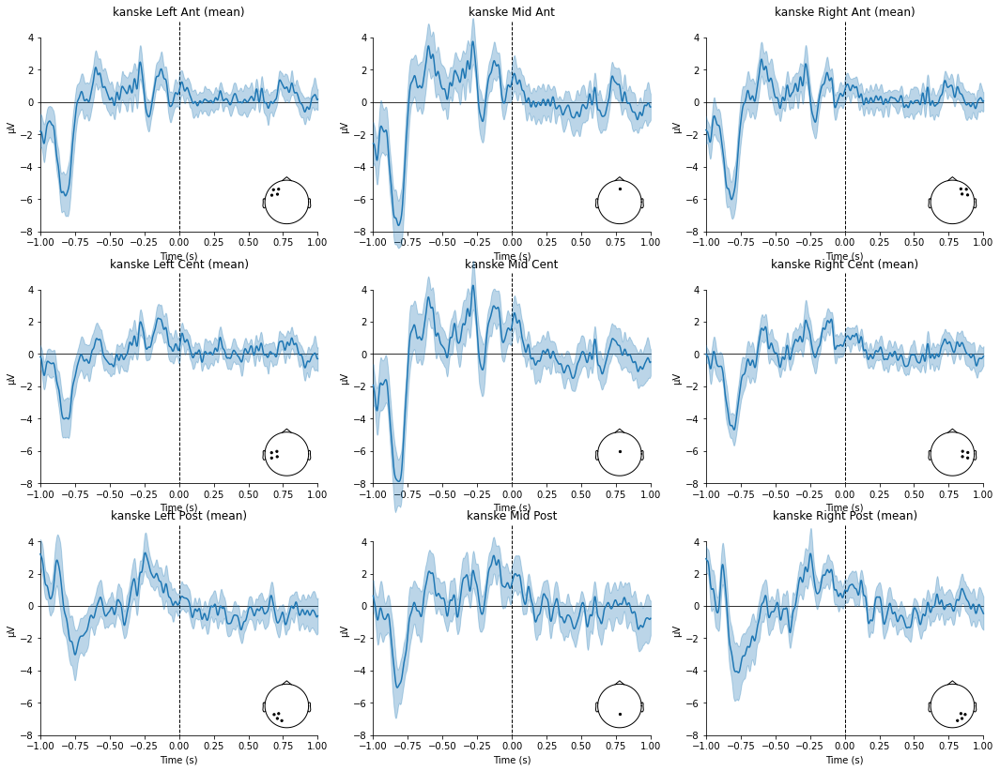

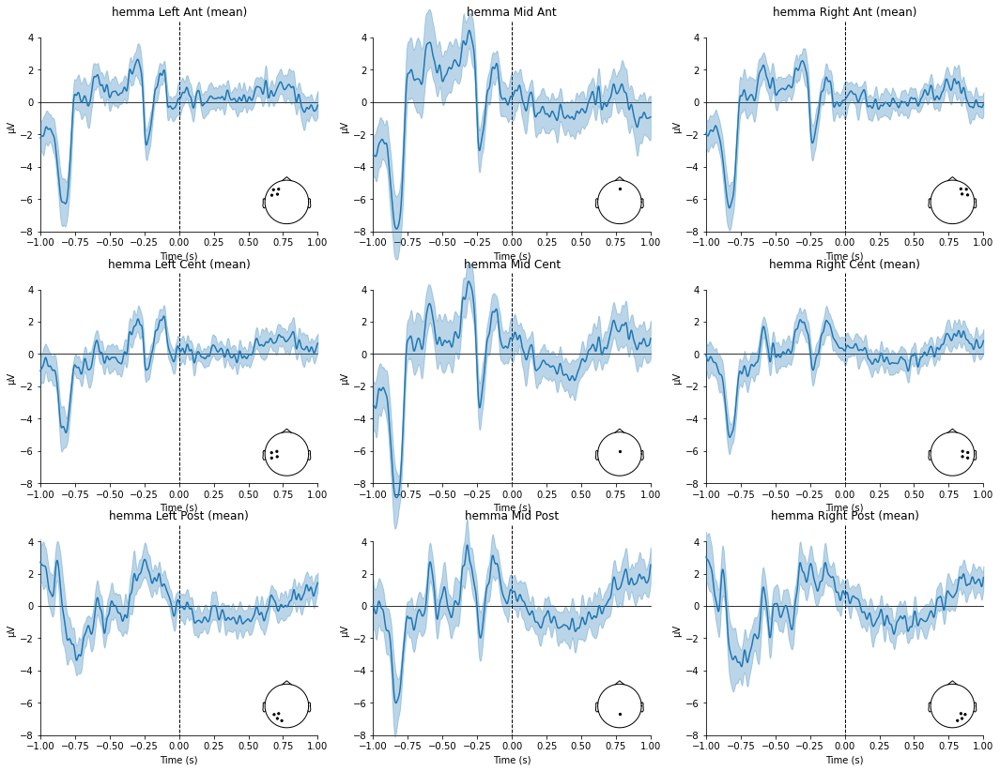

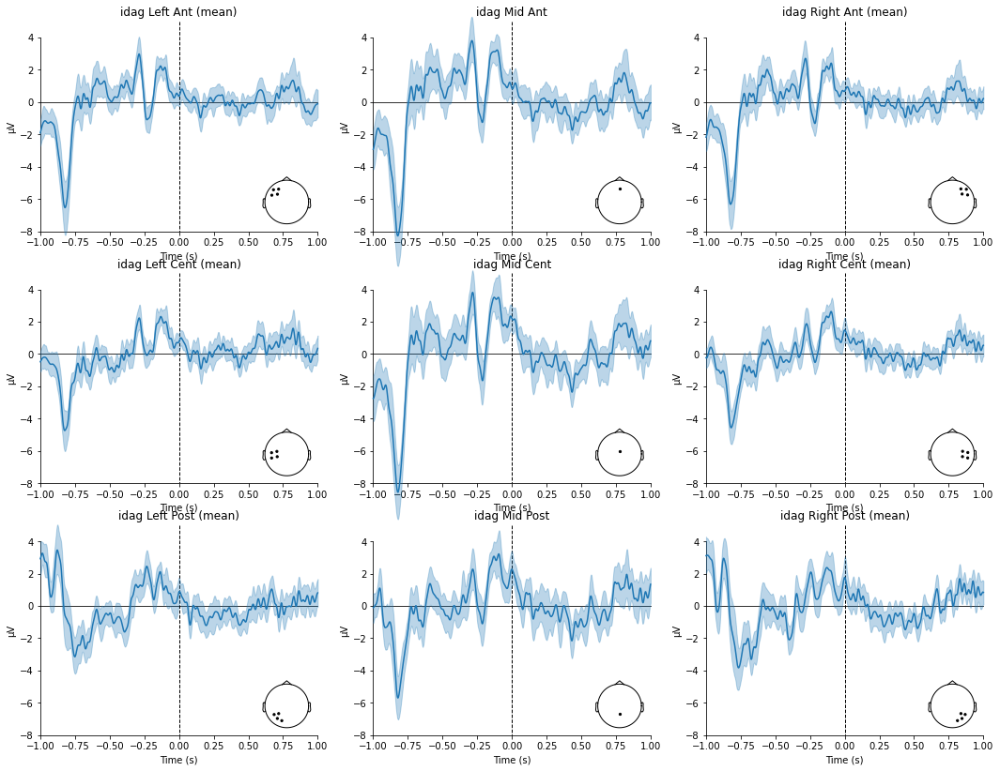

In [18]:
ylim = {'eeg':[-8, 5]}

for contr in contrasts:
    fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
    ax = 0
    for roi, chans in roi_mapping.items():
        if ax == (len(rois.items())-1):
            legend='upper left'
            show=True
        else:
            legend=False
            show=False


            
        mne.viz.plot_compare_evokeds({contr:evoked_diff[contr]},
                                     picks=chans, combine='mean',
                                     title=(contr + ' ' + roi),
                                     ylim=ylim,
                                     show_sensors='lower right', legend=False, 
                                     ci=True,
                                     axes=axs.reshape(-1)[ax], show=show
                                    );
        ax += 1

    plt.show()

---
## 100 ms baseline

## Butterfly plots with peak finding

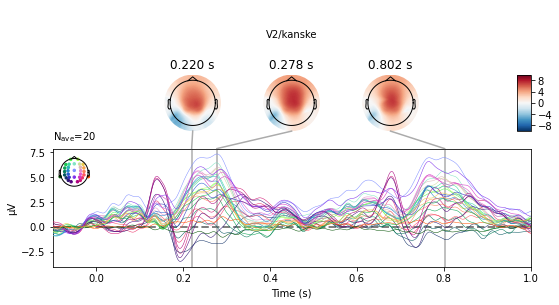

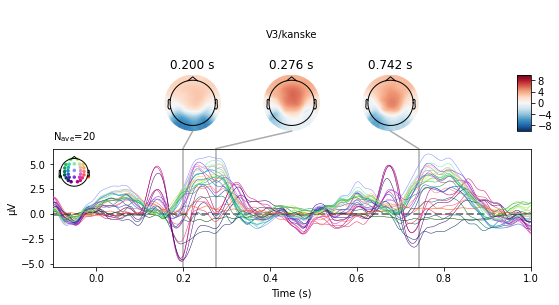

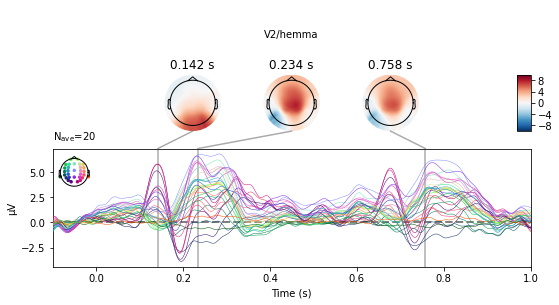

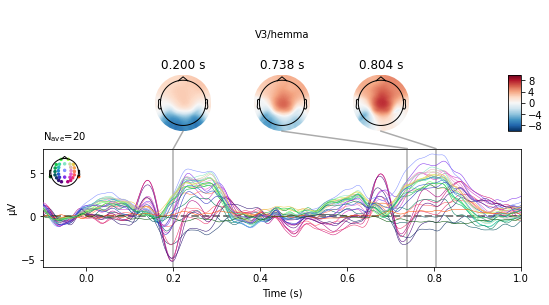

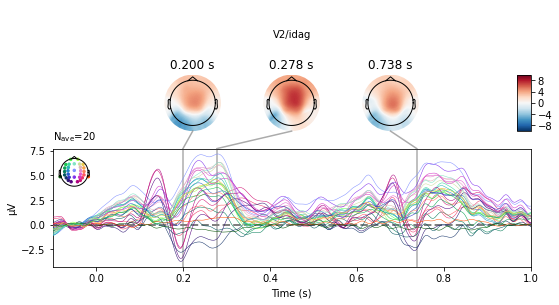

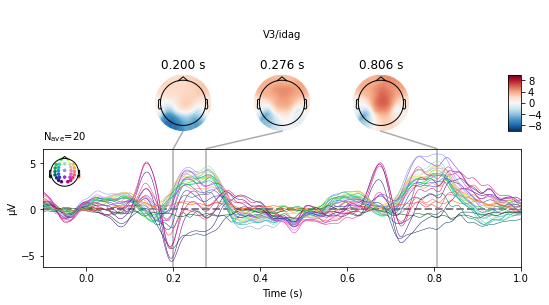

In [19]:
# Peaks based on visual inspection, running this w/o peak times specified.
# However, auto peak-finding will only find at most 3 peaks
peak_times = [.146, .240, .350, .470]
uv_range = 10

for cond in conditions:
    gavg_bs100[cond].plot_joint(title=(cond), 
                          ts_args={'hline':[0]},
                          topomap_args={'sensors':False, 'contours':False, 
                                       'vmin':-uv_range, 'vmax':uv_range})

## Topo map time series for each condition

These are not terribly informative, except to veryfiy that in general terms, the averages for all conditions look broadly similar and non-problematic.

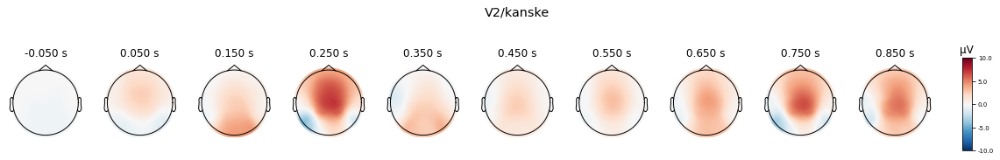

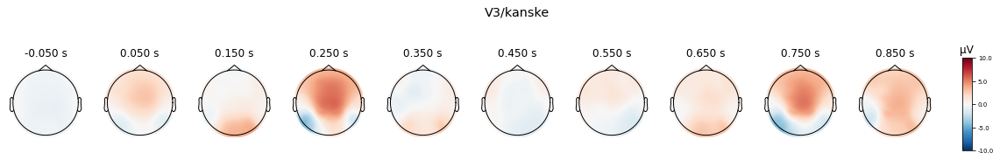

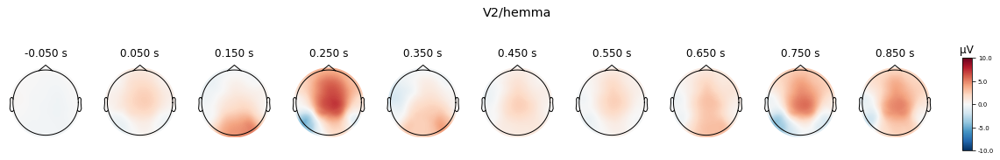

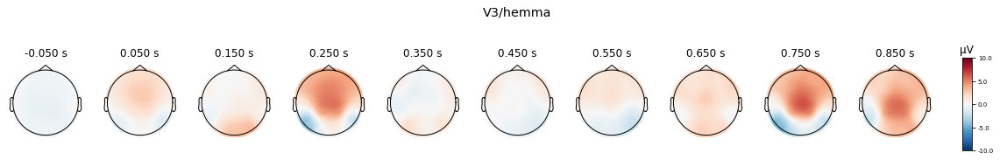

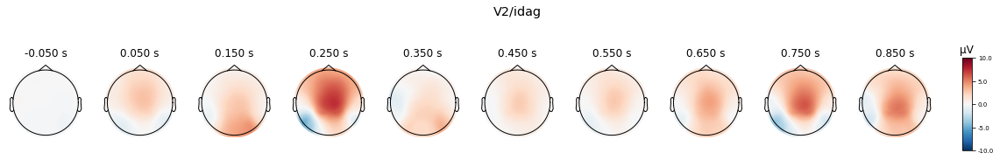

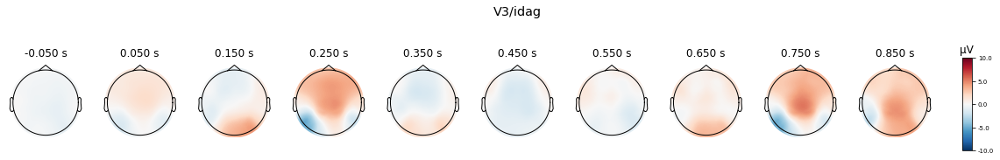

In [20]:
uv_range = 10

for cond in conditions:
    gavg_bs100[cond].plot_topomap(times, average=0.050,
                           ch_type='eeg', 
                           show_names=False, sensors=False, contours=False, 
                           colorbar=True, 
                           vmin=-uv_range, vmax=uv_range,
                           title=(cond)
                          )


## Waveforms

In [21]:
colors = {'V2/kanske':'darkviolet', 
          'V3/kanske':'dodgerblue', 
          'V2/hemma':'green', 
          'V3/hemma':'green', 
          'V2/idag':'crimson',
          'V3/idag':'crimson'
         }

linestyles = {'V2/kanske':'-', 
              'V3/kanske': '--', 
              'V2/hemma':'-', 
              'V3/hemma':'--', 
              'V2/idag':'-',
              'V3/idag':'--'
             }

### Averaged across groups

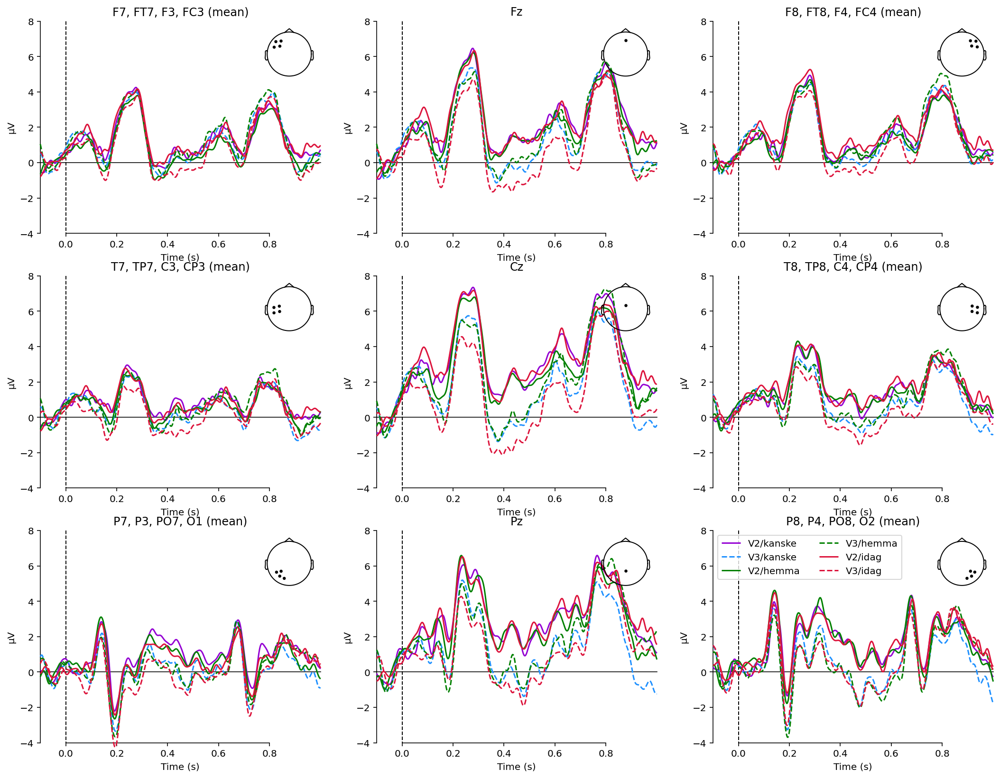

In [22]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({c:evoked_bs100[c] for c in conditions},
                                 picks=chans, combine='mean',
#                                  title=roi,
                                 colors=colors, linestyles=linestyles,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=False,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  

### kanske
#### V2 vs. V3

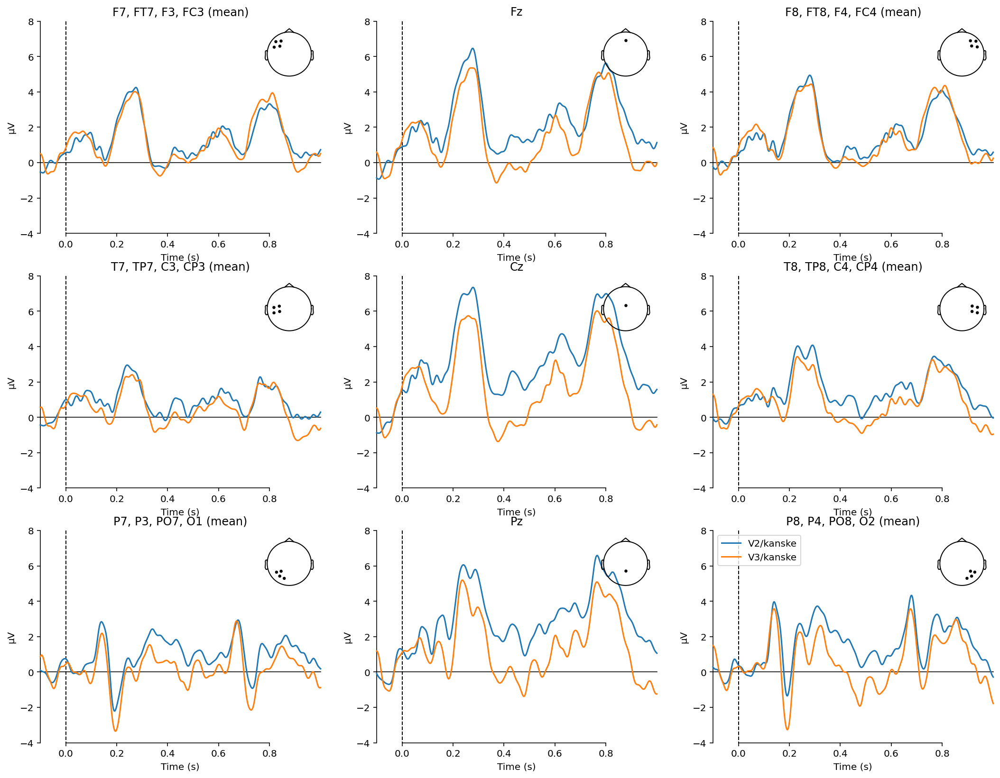

In [23]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({c:evoked_bs100[c] for c in conditions[0:2]},
                                 picks=chans, combine='mean',
#                                  title=roi,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=False,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  

### hemma
#### V2 vs. V3

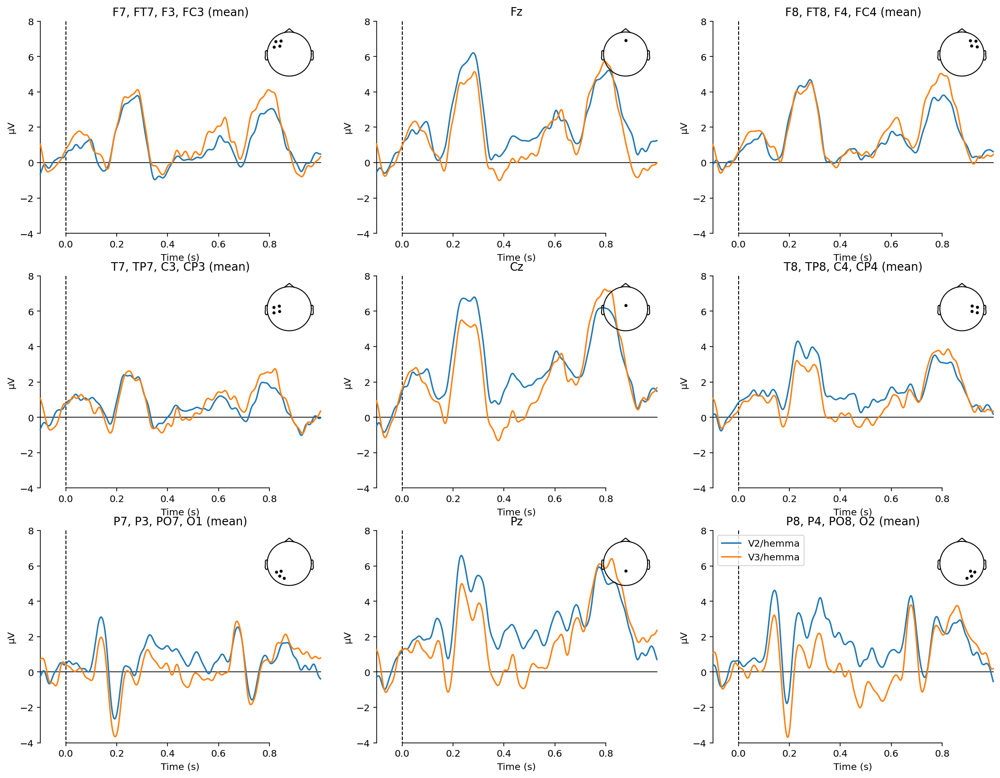

In [24]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({c:evoked_bs100[c] for c in conditions[2:4]},
                                 picks=chans, combine='mean',
#                                  title=roi,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=False,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  

### Idag
#### V2 vs. V3

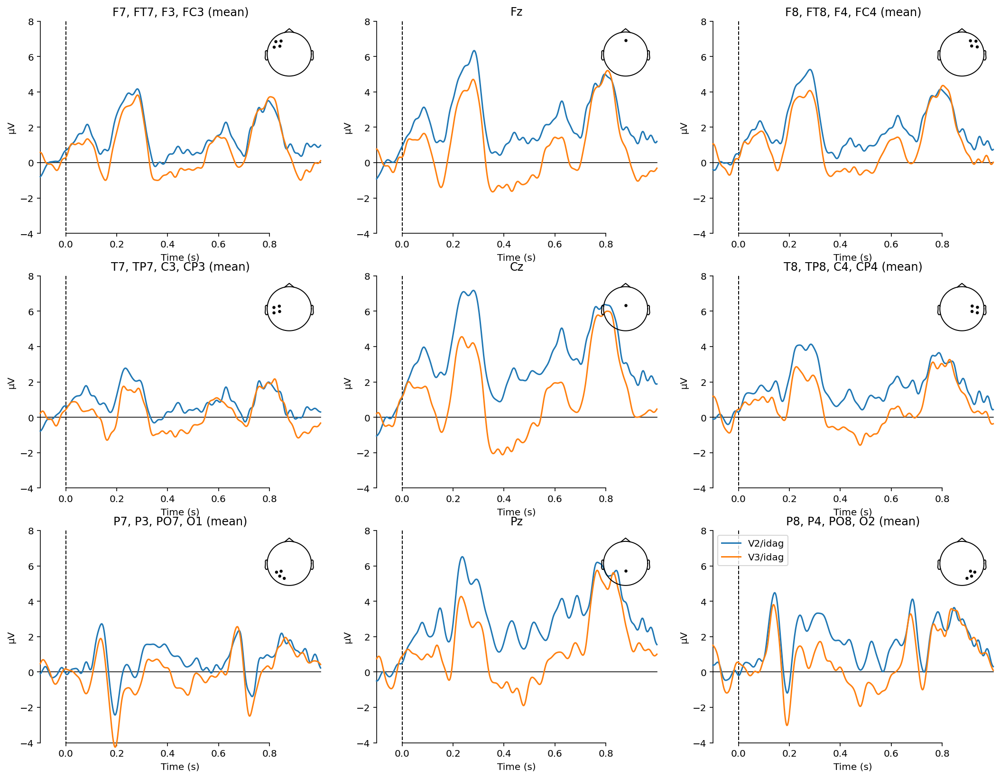

In [25]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({c:evoked_bs100[c] for c in conditions[4:6]},
                                 picks=chans, combine='mean',
#                                  title=roi,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=False,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  

## With CIs

### kanske
#### V2 vs. V3

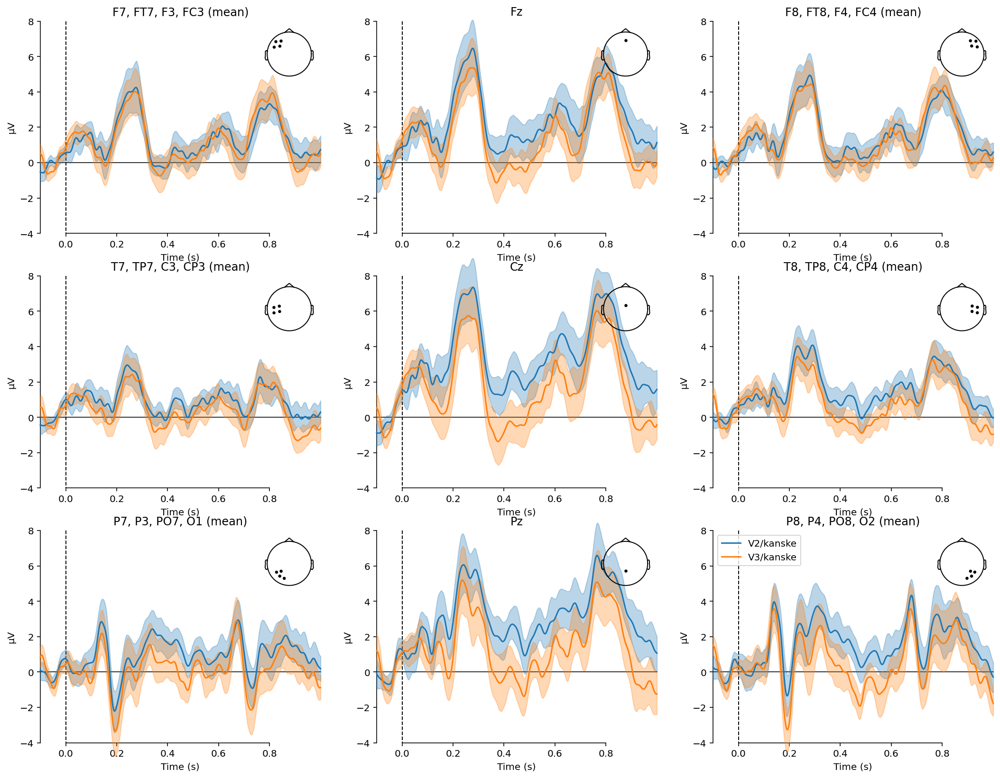

In [26]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({c:evoked_bs100[c] for c in conditions[0:2]},
                                 picks=chans, combine='mean',
#                                  title=roi,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=True,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  

### hemma
#### V2 vs. V3

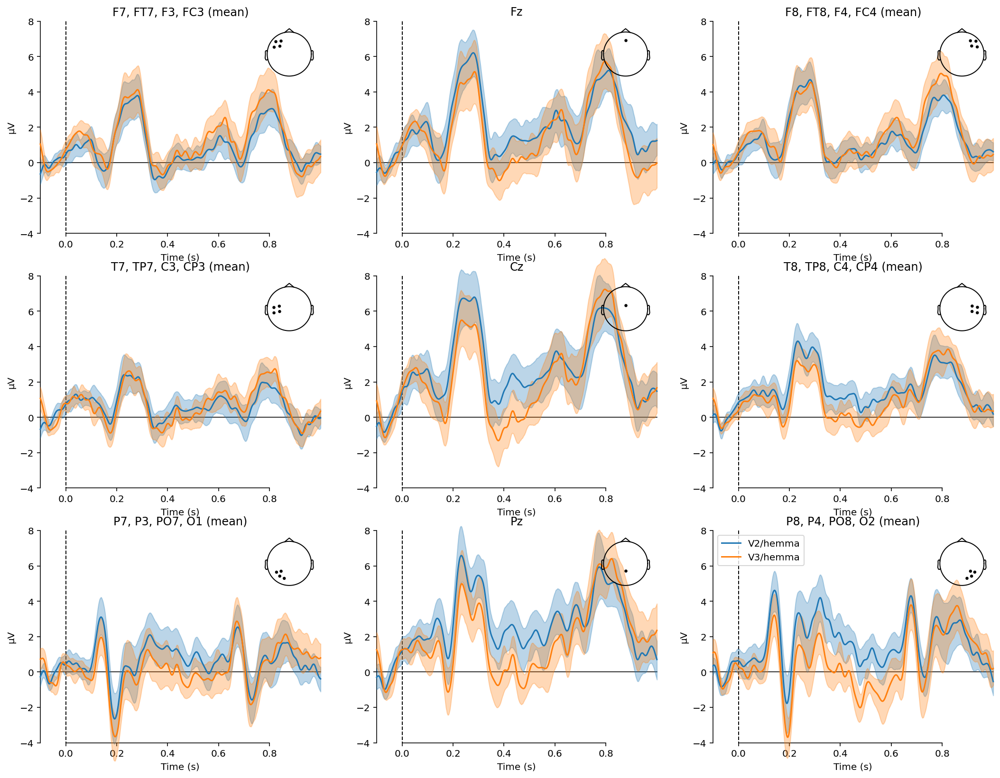

In [27]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({c:evoked_bs100[c] for c in conditions[2:4]},
                                 picks=chans, combine='mean',
#                                  title=roi,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=True,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  

### Idag
#### V2 vs. V3

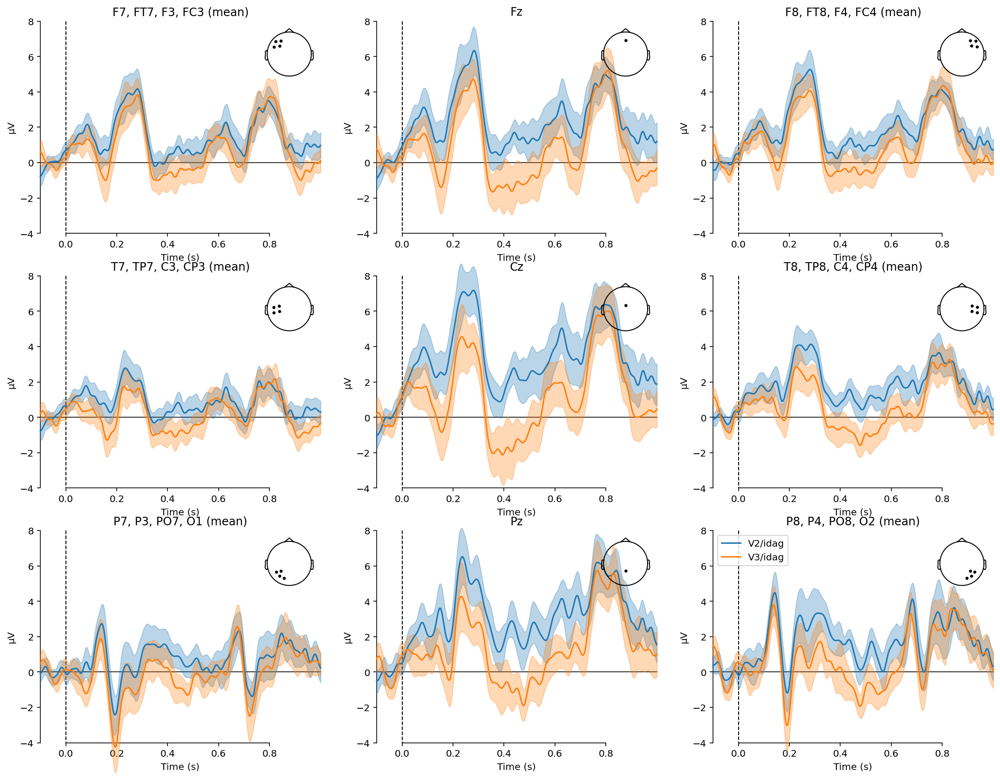

In [28]:
ylim = {'eeg':[-4, 8]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({c:evoked_bs100[c] for c in conditions[4:6]},
                                 picks=chans, combine='mean',
#                                  title=roi,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=True,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  

---
# Contrasts 

### Topo Plots

#### 100 ms time windows

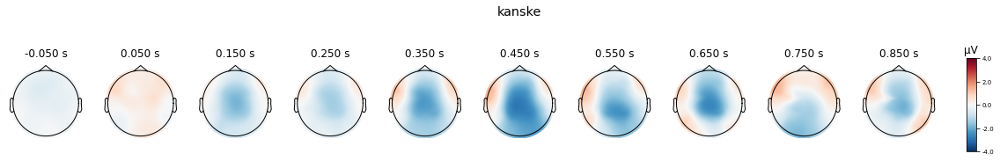

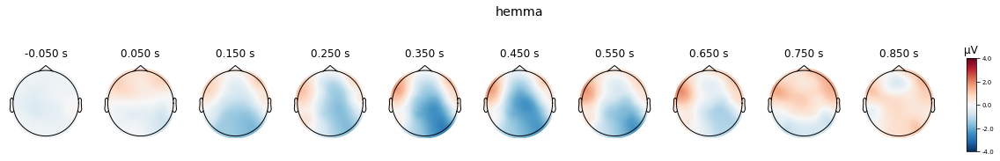

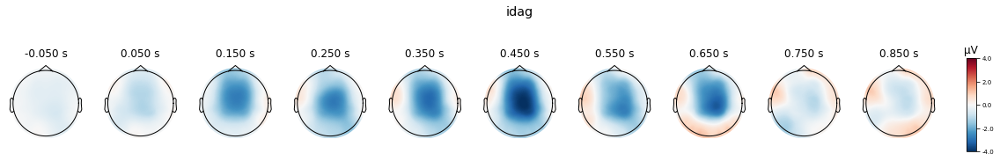

In [29]:
times = np.arange(-.050, .950, .100)

uv_range = 4

for contr in contrasts:
     mne.grand_average(evoked_diff_bs100[contr]).plot_topomap(times, average=0.050,
                                                       ch_type='eeg', 
                                                       show_names=False, sensors=False, contours=False, 
                                                       colorbar=True, 
                                                       vmin=-uv_range, vmax=uv_range,
                                                       title=(contr)
                                                      )

#### A priori time windows

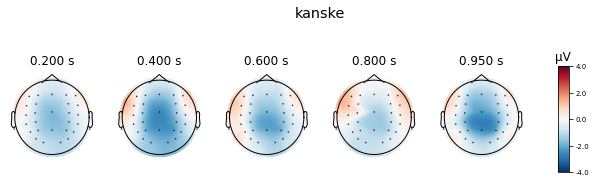

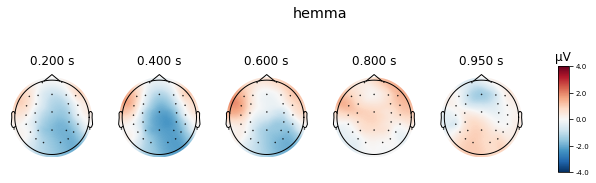

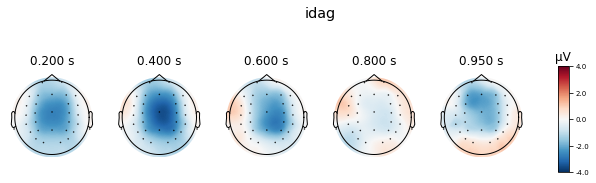

In [30]:
uv_range = 4

for contr in contrasts:
     mne.grand_average(evoked_diff_bs100[contr]).plot_topomap([np.median(t) for t in time_wins], average=0.120,
                                                       ch_type='eeg', 
                                                       show_names=False, sensors=True, contours=False, 
                                                       colorbar=True, 
                                                       vmin=-uv_range, vmax=uv_range,
                                                       title=(contr)
                                                      )

### Contrast waveforms, all subjects

### kanske
#### V3-V2

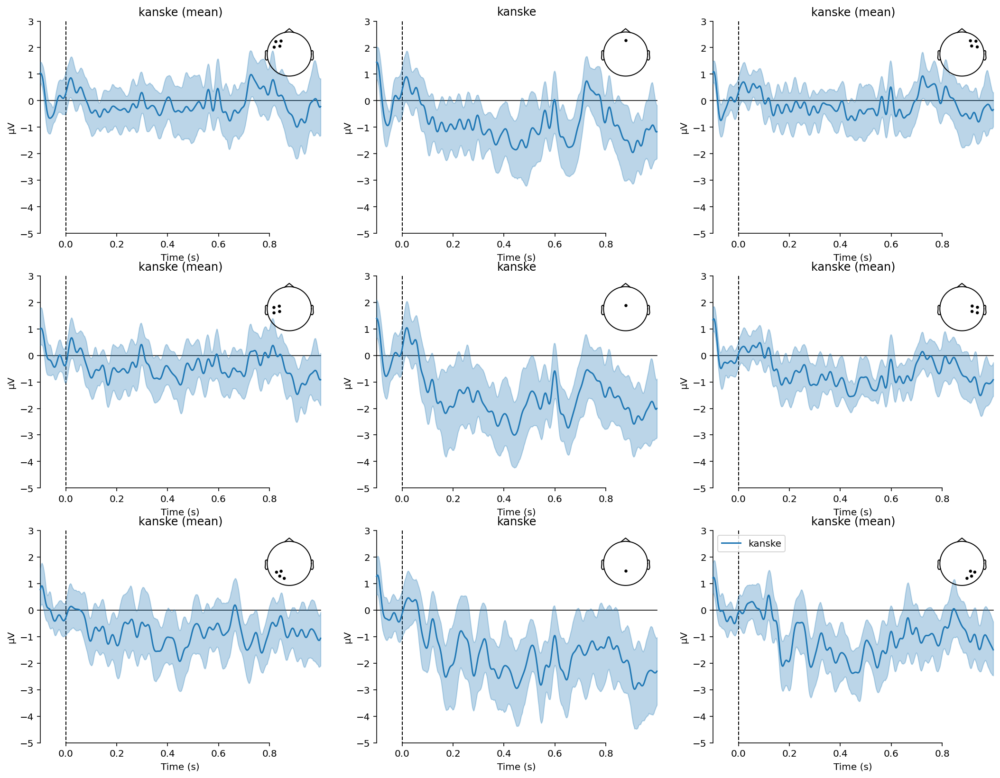

In [31]:
cond = 'kanske'
ylim = {'eeg':[-5, 3]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({cond:evoked_diff_bs100[cond]},
#         {c:evoked_bs100[c] for c in conditions[4:6]},
                                 picks=chans, combine='mean',
                                 title=cond,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=True,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  


### hemma
#### V3-V2

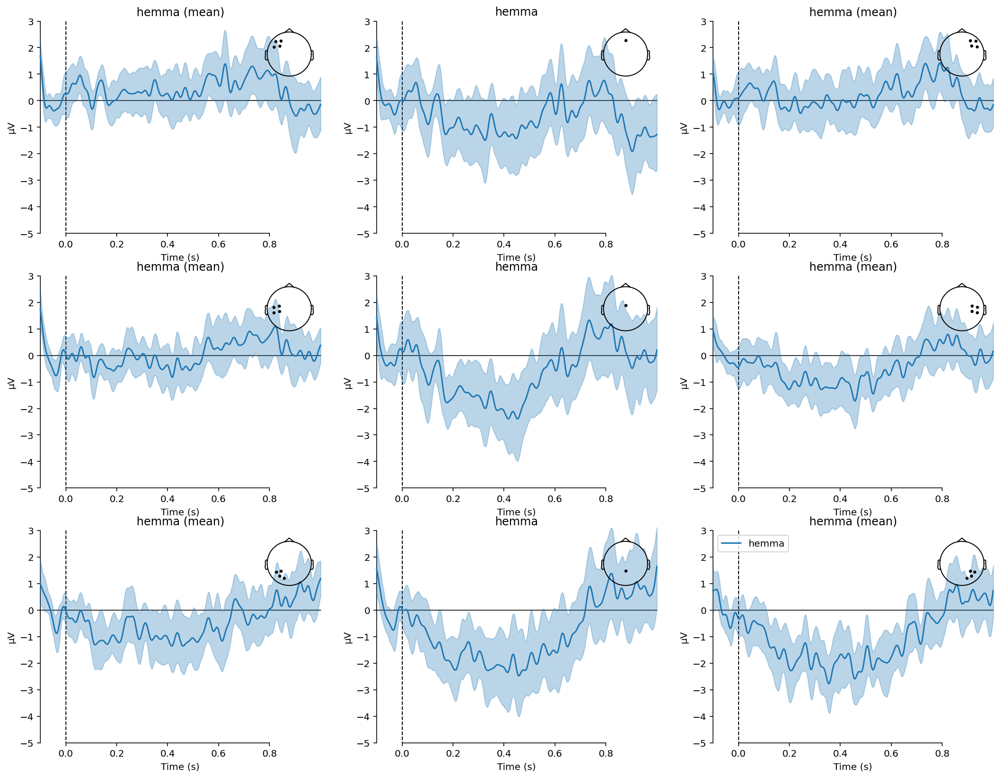

In [32]:
cond = 'hemma'
ylim = {'eeg':[-5, 3]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({cond:evoked_diff_bs100[cond]},
#         {c:evoked_bs100[c] for c in conditions[4:6]},
                                 picks=chans, combine='mean',
                                 title=cond,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=True,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  


### idag
#### V3-V2

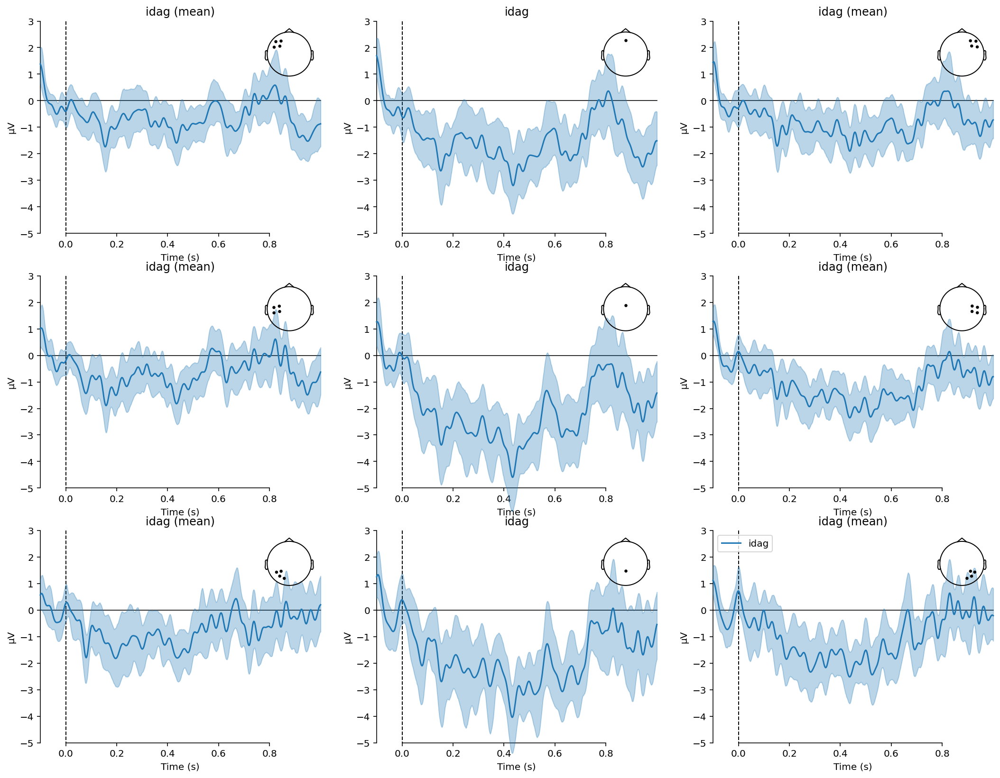

In [33]:
cond = 'idag'
ylim = {'eeg':[-5, 3]}
matplotlib.rcParams['figure.dpi'] = 144  

fig, axs = plt.subplots(3, 3, figsize=(18, 14))    
ax = 0
for roi, chans in roi_mapping.items():
    if ax == (len(rois.items())-1):
        legend='upper left'
        show=True
    else:
        legend=False
        show=False

    mne.viz.plot_compare_evokeds({cond:evoked_diff_bs100[cond]},
#         {c:evoked_bs100[c] for c in conditions[4:6]},
                                 picks=chans, combine='mean',
                                 title=cond,
                                 ylim=ylim,
                                 show_sensors='upper right', legend=legend, 
                                 ci=True,
                                 axes=axs.reshape(-1)[ax], show=show
                                );
    ax += 1

plt.show()
matplotlib.rcParams['figure.dpi'] = 72  
